In [185]:
import cv2
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 20)

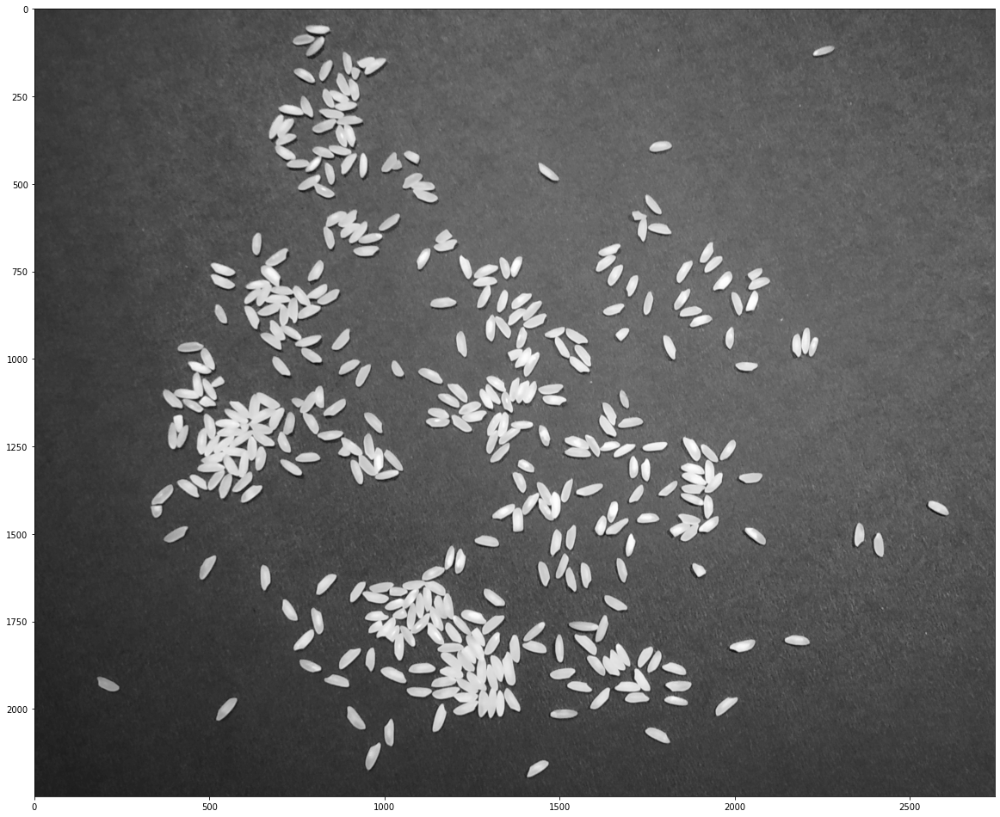

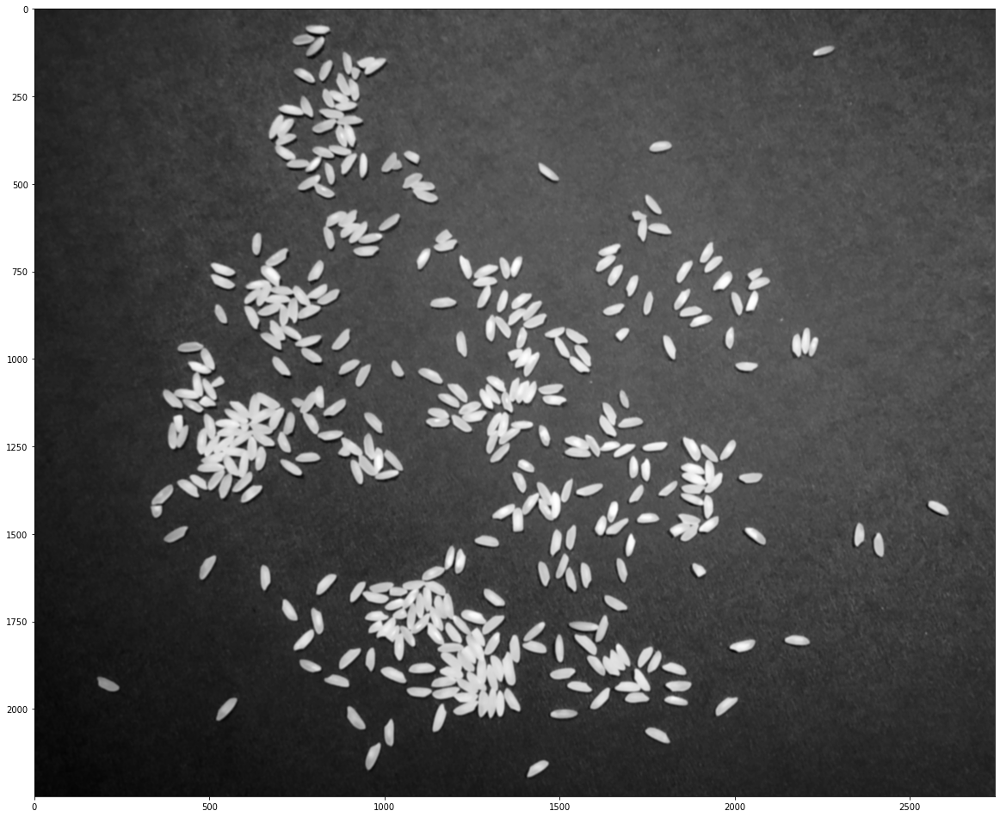

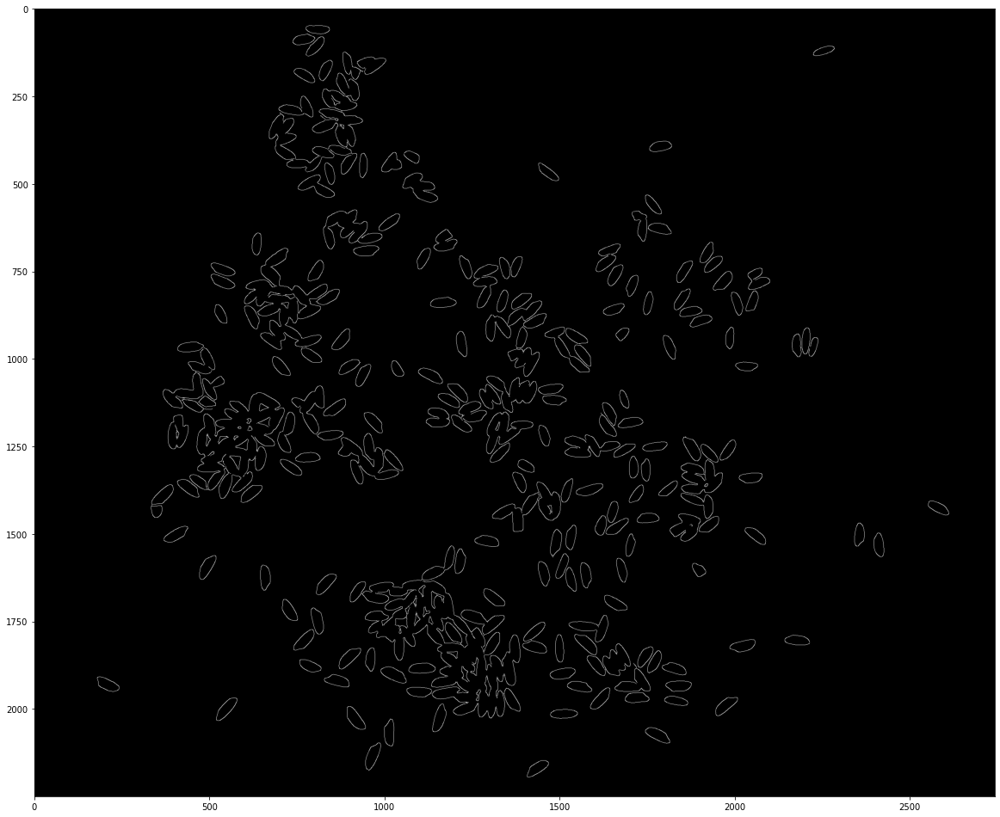

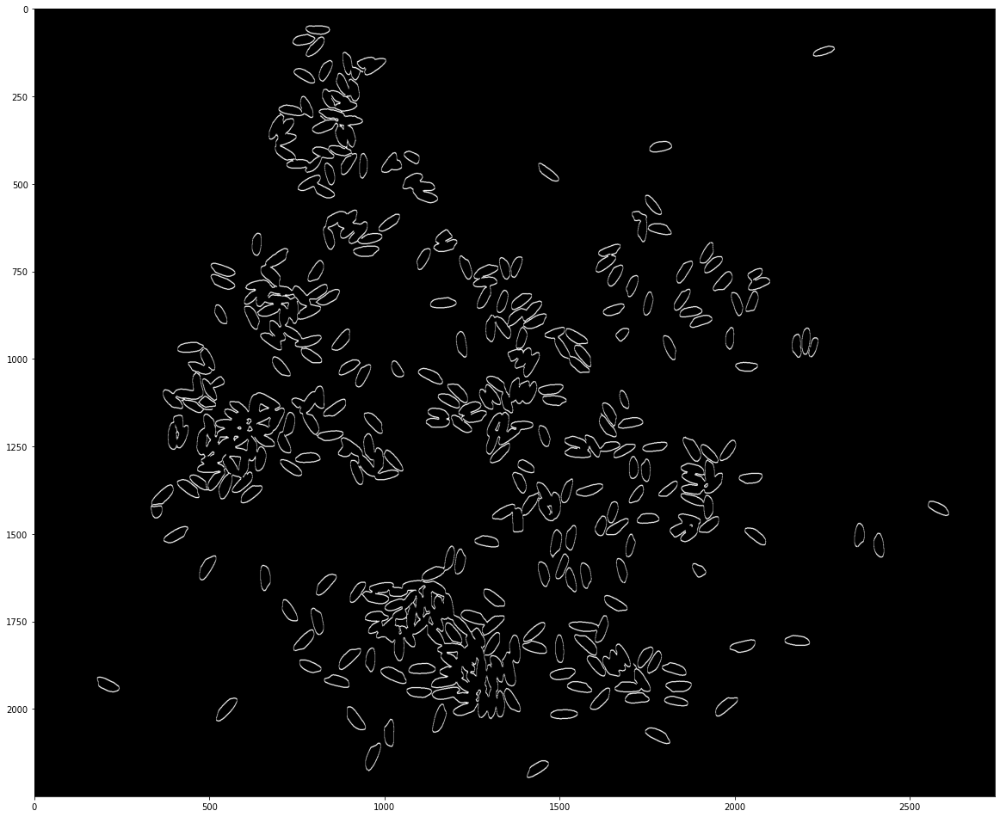

Grains in the image:  268


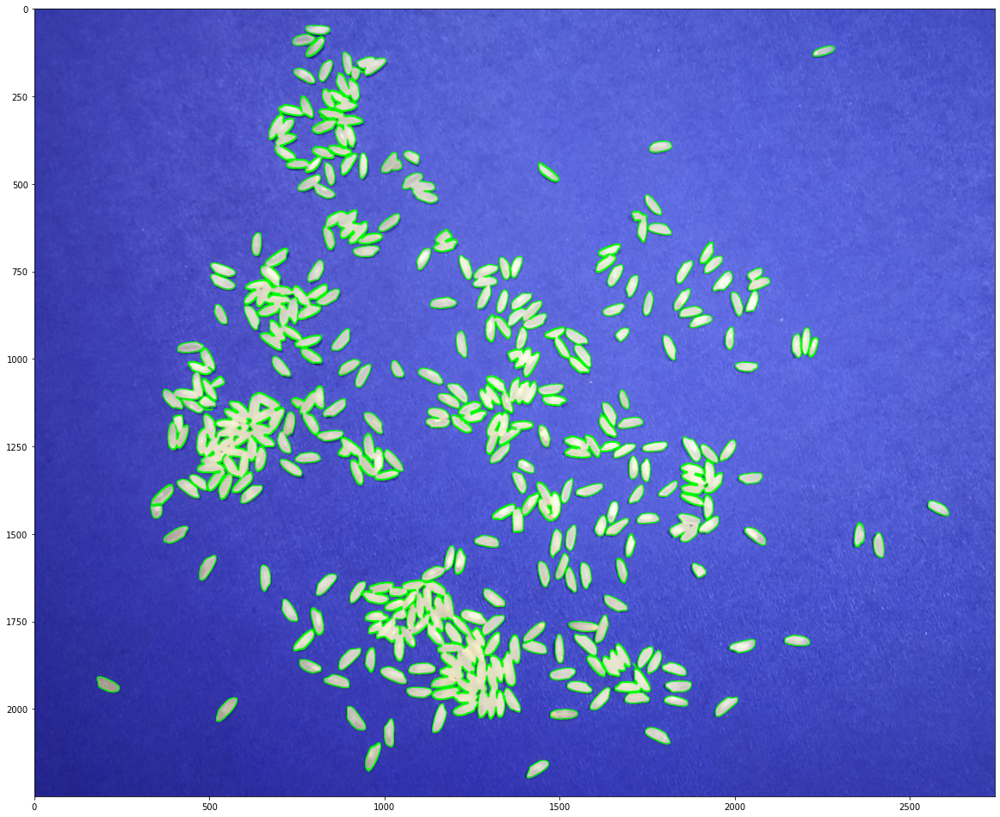

In [186]:
image = cv2.imread('./train/full_grain_1.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')
plt.show()

blur = cv2.GaussianBlur(gray, (11, 11), 0)
plt.imshow(blur, cmap='gray')
plt.rcParams['figure.figsize'] = (20, 20)
plt.show()

canny = cv2.Canny(blur, 30, 150,3)
plt.imshow(canny, cmap='gray')
plt.show()

dilated = cv2.dilate(canny, (1,1), iterations=2)
plt.imshow(dilated, cmap='gray')
plt.show()
(cnt, heirarchy) = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
cv2.drawContours(rgb, cnt, -1, (0, 255, 0), 2)
plt.imshow(rgb)

print("Grains in the image: ", len(cnt))
plt.show()

#### Watershed

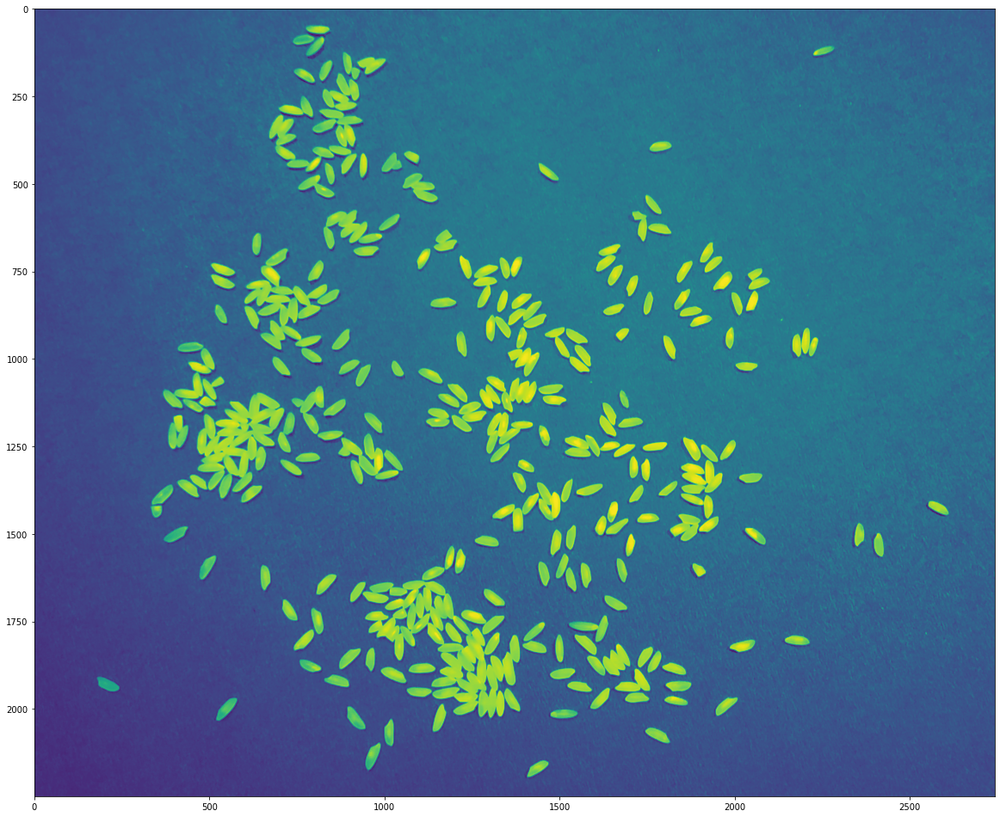

[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


In [187]:
image = cv2.imread('./train/full_grain_1.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plt.imshow(gray)
plt.rcParams['figure.figsize'] = (20, 20)
plt.show()
print(thresh)

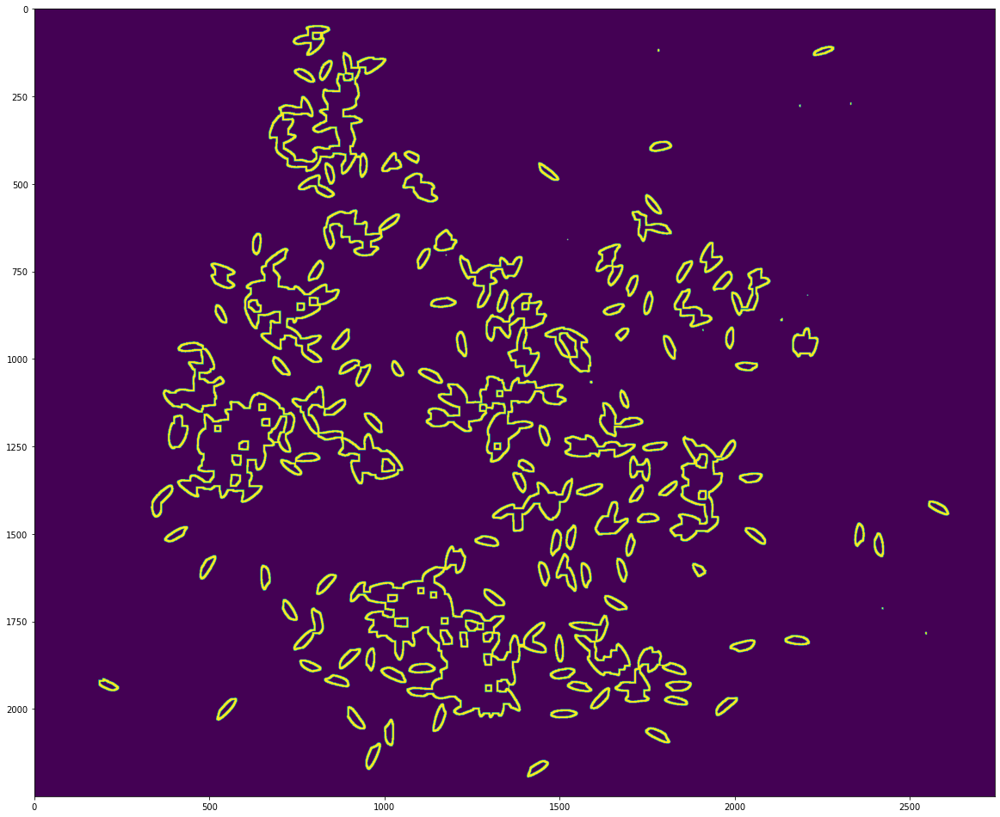

In [188]:
# noise removal
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 5)
# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=5)
# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.002*dist_transform.max(),255,0)
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
plt.imshow(unknown)
plt.rcParams['figure.figsize'] = (20, 20)
plt.show()


In [189]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

In [190]:
markers = cv2.watershed(image,markers)
image[markers == -1] = [255,0,0]

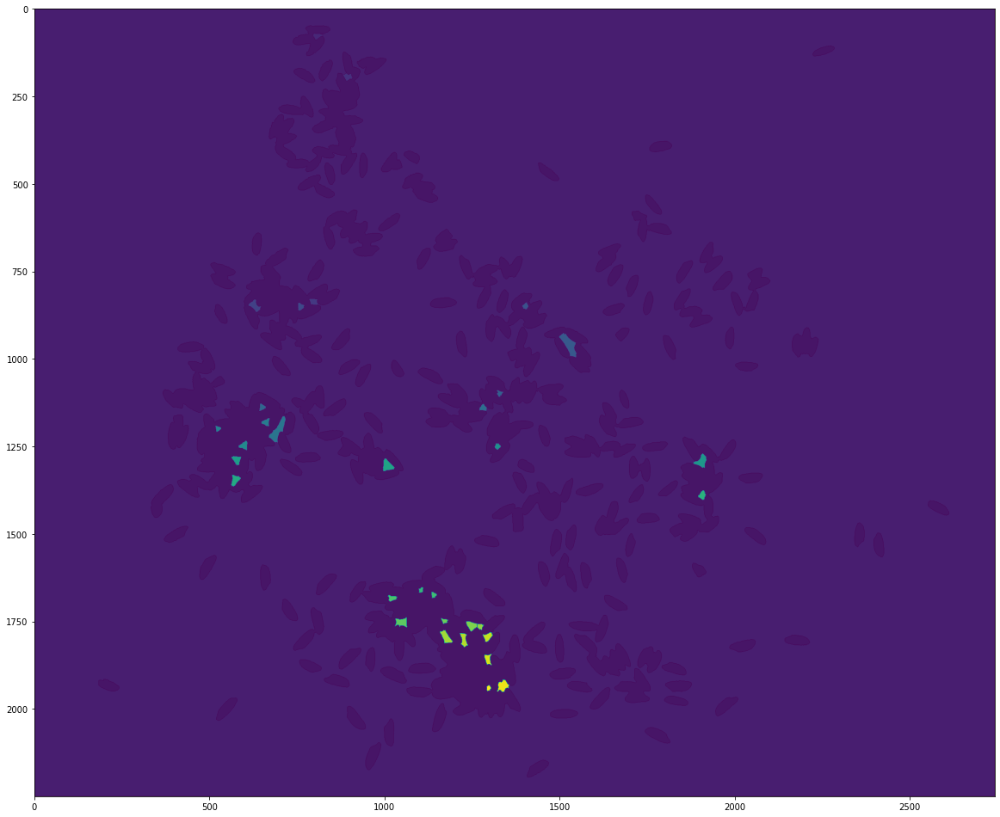

In [191]:
plt.imshow(markers)
plt.rcParams['figure.figsize'] = (20, 20)
plt.show()


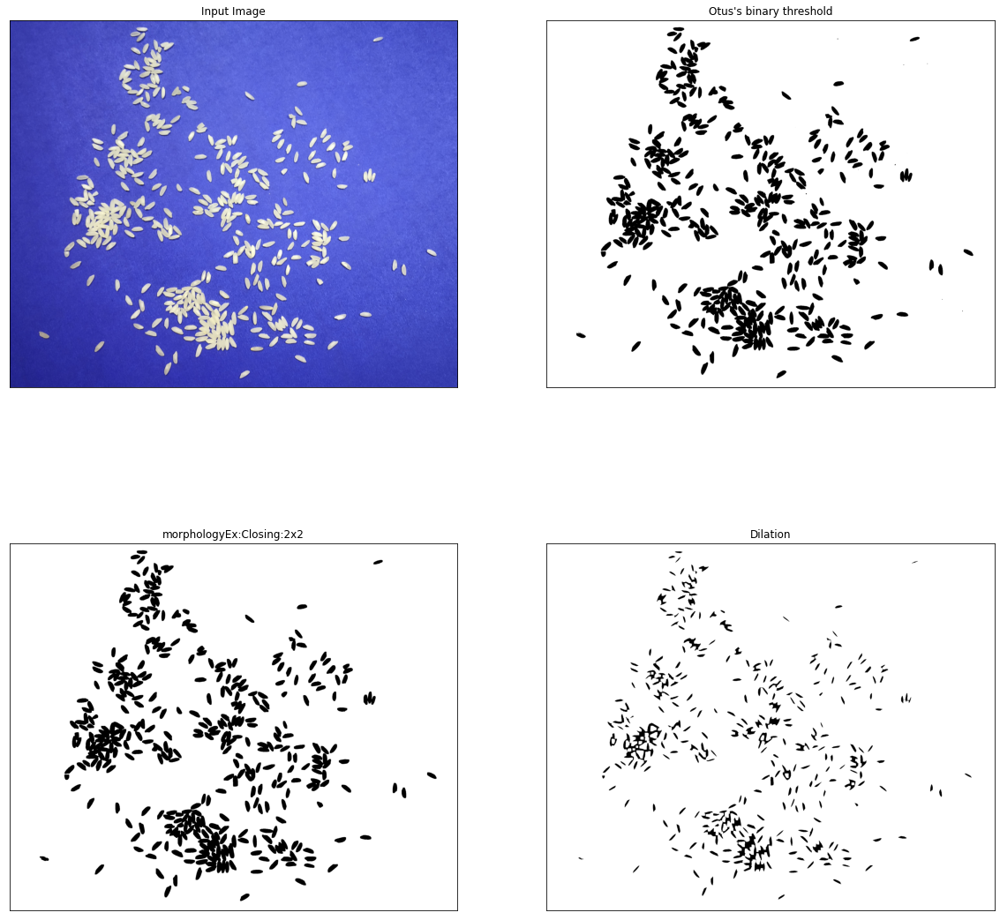

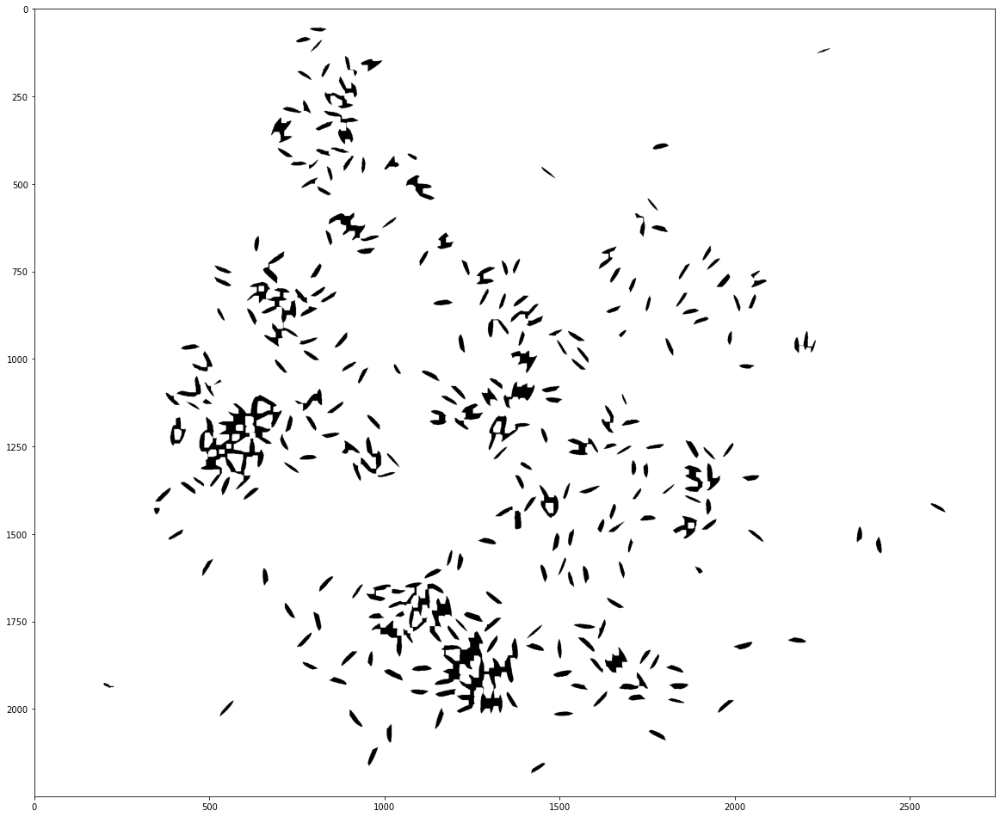

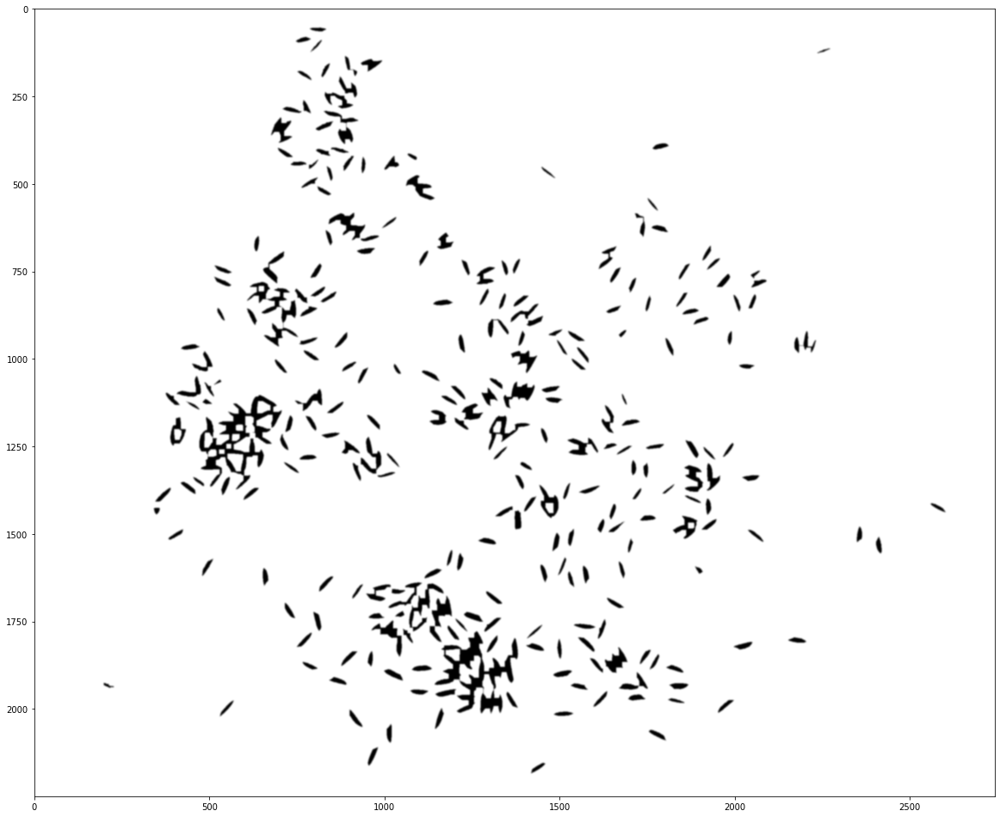

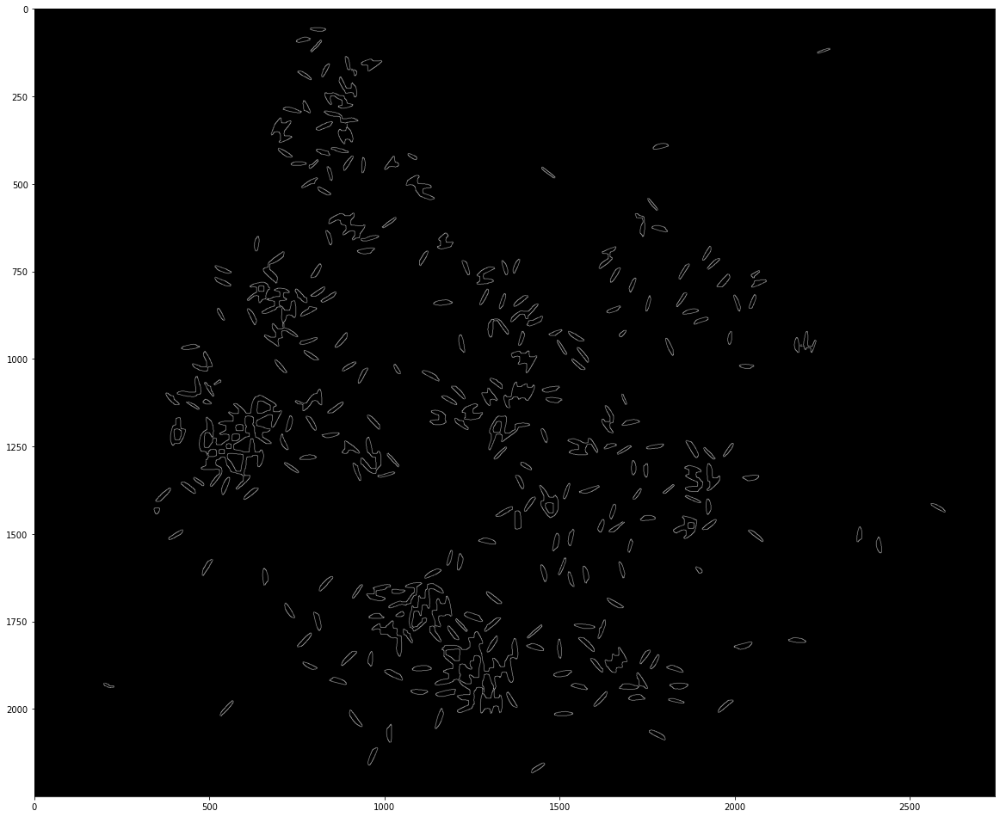

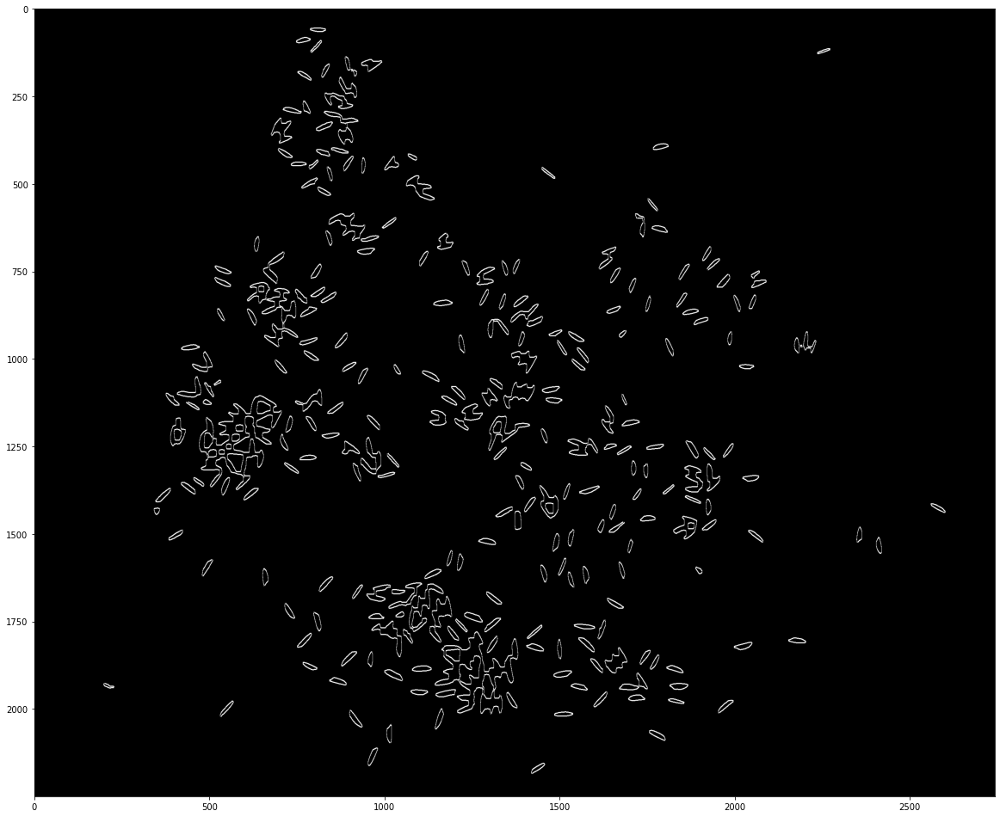

Grains in the image:  303


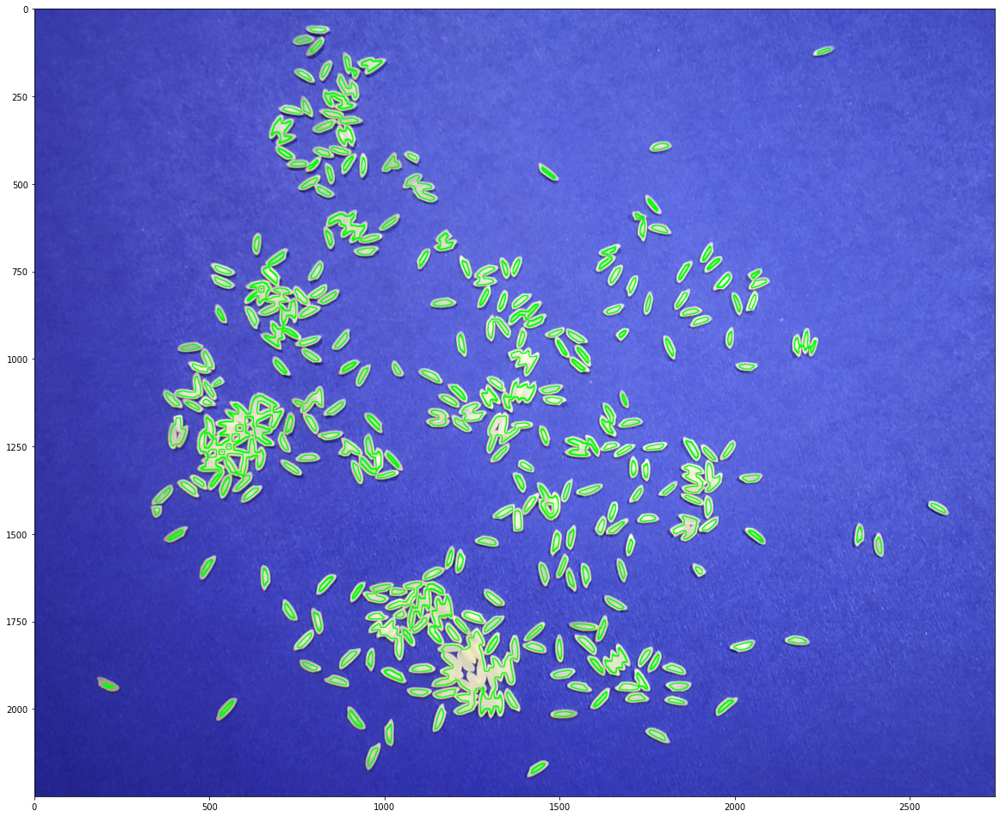

In [3]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread('./train/full_grain_1.jpg')
b,g,r = cv2.split(img)
rgb_img = cv2.merge([r,g,b])

gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

# noise removal
kernel = np.ones((5,5),np.uint8)
#opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)
closing = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel, iterations = 2)

# sure background area
sure_bg = cv2.dilate(closing,kernel,iterations=3)

plt.subplot(221),plt.imshow(rgb_img)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(thresh, 'gray')
plt.title("Otus's binary threshold"), plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(closing, 'gray')
plt.title("morphologyEx:Closing:2x2"), plt.xticks([]), plt.yticks([])
plt.subplot(224),plt.imshow(sure_bg, 'gray')
plt.title("Dilation"), plt.xticks([]), plt.yticks([])
plt.show()
cl=cv2.cvtColor(sure_bg,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(cl, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')
plt.show()

blur = cv2.GaussianBlur(gray, (11, 11), 0)
plt.imshow(blur, cmap='gray')
plt.rcParams['figure.figsize'] = (20, 20)
plt.show()

canny = cv2.Canny(blur, 30, 150,3)
plt.imshow(canny, cmap='gray')
plt.show()

dilated = cv2.dilate(canny, (1,1), iterations=2)
plt.imshow(dilated, cmap='gray')
plt.show()
(cnt, heirarchy) = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
cv2.drawContours(rgb, cnt, -1, (0, 255, 0), 2)
plt.imshow(rgb)
print("Grains in the image: ", len(cnt))
plt.show()


In [13]:
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from scipy import ndimage
import numpy as np
import argparse
import imutils
import cv2
import matplotlib.pyplot as plt

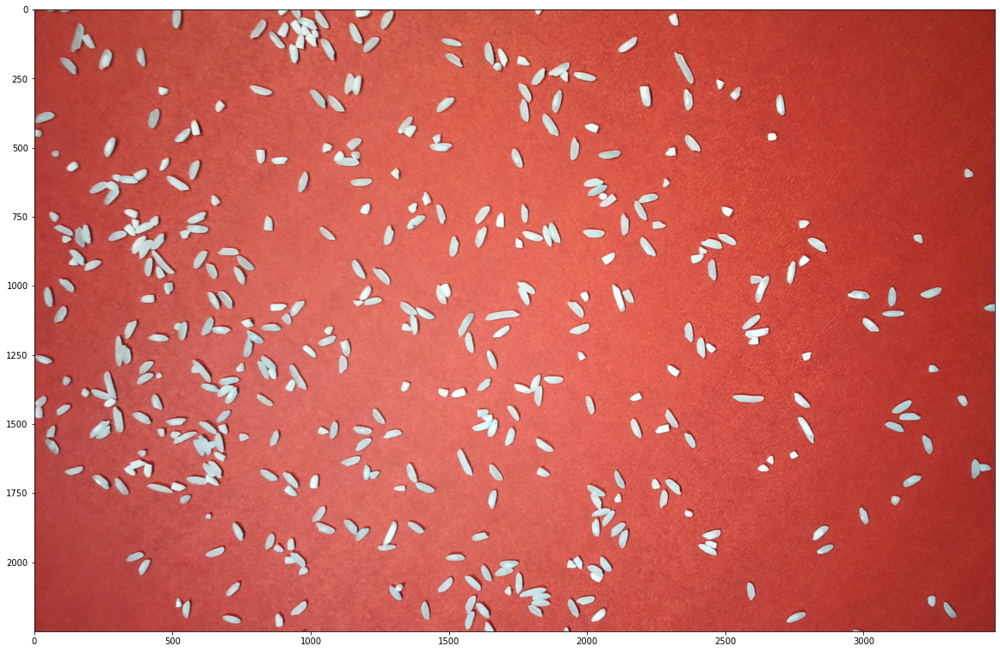

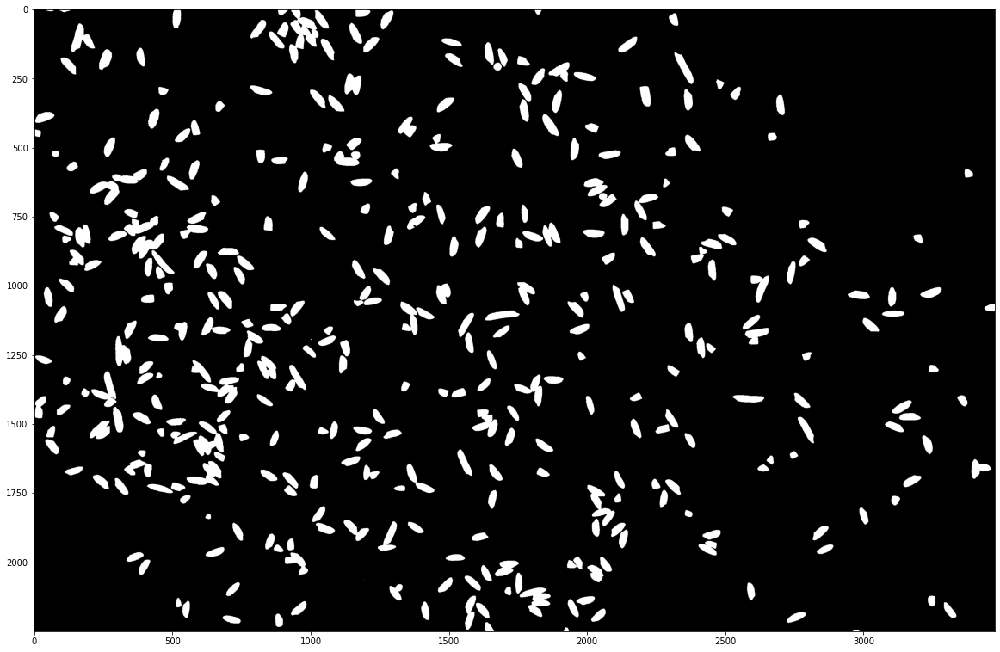

In [14]:
image = cv2.imread('./train/mixed_grain_1.jpg')
shifted = cv2.pyrMeanShiftFiltering(image, 21, 51)
plt.imshow(image)
plt.show()
# convert the mean shift image to grayscale, then apply
# Otsu's thresholding
gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255,
	cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
plt.imshow(thresh, cmap='gray')
plt.show()

In [15]:
D = ndimage.distance_transform_edt(thresh)
localMax = peak_local_max(D, indices=False, min_distance=20,
	labels=thresh)
# perform a connected component analysis on the local peaks,
# using 8-connectivity, then appy the Watershed algorithm
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-D, markers, mask=thresh)
print("[INFO] {} unique segments found".format(len(np.unique(labels)) - 1))

C:\Users\rohit\AppData\Local\Temp\ipykernel_27568\2913081639.py:2: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  localMax = peak_local_max(D, indices=False, min_distance=20,


[INFO] 405 unique segments found


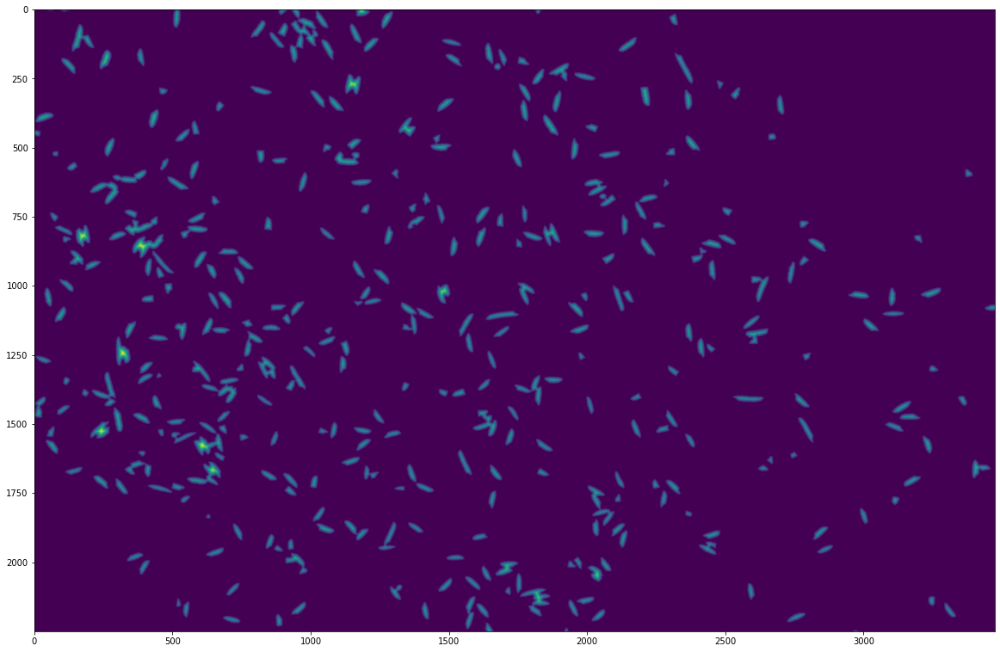

In [16]:
plt.imshow(D)
plt.show()

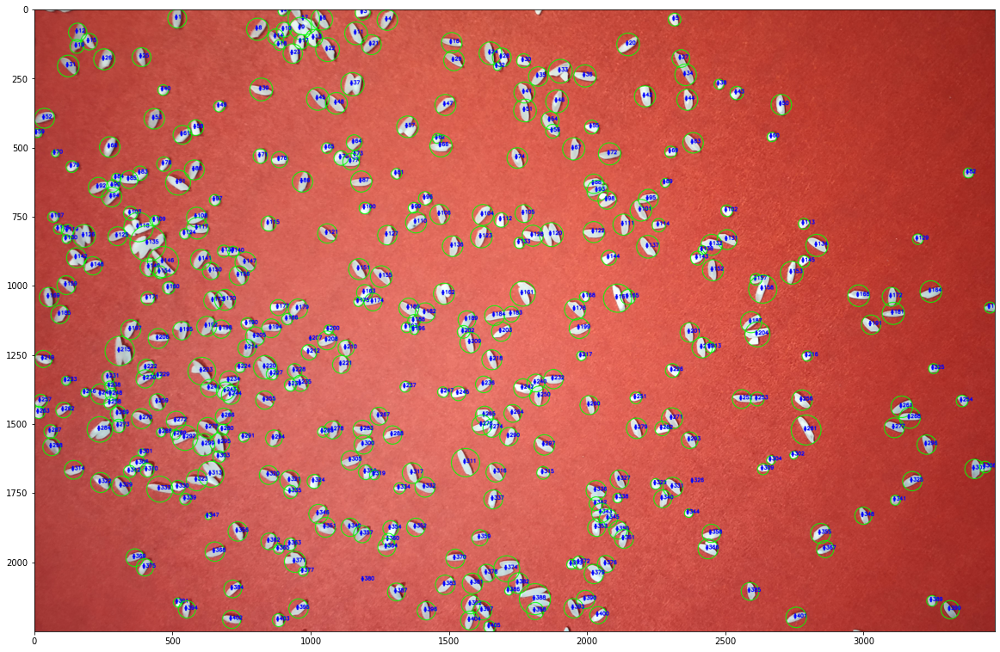

In [17]:
# loop over the unique labels returned by the Watershed
# algorithm
for label in np.unique(labels):
	# if the label is zero, we are examining the 'background'
	# so simply ignore it
	if label == 0:
		continue
	# otherwise, allocate memory for the label region and draw
	# it on the mask
	mask = np.zeros(gray.shape, dtype="uint8")
	mask[labels == label] = 255
	# detect contours in the mask and grab the largest one
	cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,
		cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key=cv2.contourArea)
	# draw a circle enclosing the object
	((x, y), r) = cv2.minEnclosingCircle(c)
	cv2.circle(image, (int(x), int(y)), int(r), (0, 255, 0), 2)
	cv2.putText(image, "#{}".format(label), (int(x) - 10, int(y)),
		cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
# show the output image
plt.rcParams['figure.figsize'] = (20, 20)

plt.imshow( image)
plt.show()


In [26]:
np.unique(labels[20])

array([0, 1, 2, 3, 4, 5, 6, 7])